In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns

import missingno as msno 

dashes = dashes='---'*20

import warnings
warnings.filterwarnings("ignore")

In [2]:
pd.set_option('display.max_columns', None)  
df_1 = pd.read_csv('data/water_table.csv')
labels = pd.read_csv('data/water_table_labels.csv')
df_1['target'] = labels['status_group']

In [3]:
df_1['target'] = df_1['target'].map({'functional':0,'non functional':1,'functional needs repair':2})
df_1.drop('id',axis=1, inplace=True)

In [4]:
df_1.head()

,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,target
0,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,Lake Nyasa,Mnyusi B,Iringa,11,5,Ludewa,Mundindi,109,True,GeoData Consultants Ltd,VWC,Roman,False,1999,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,0
1,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,Lake Victoria,Nyamara,Mara,20,2,Serengeti,Natta,280,NaN,GeoData Consultants Ltd,Other,NaN,True,2010,gravity,gravity,gravity,wug,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,0
2,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,Pangani,Majengo,Manyara,21,4,Simanjiro,Ngorika,250,True,GeoData Consultants Ltd,VWC,Nyumba ya mungu pipe scheme,True,2009,gravity,gravity,gravity,vwc,user-group,pay per bucket,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,0
3,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,Mahakamani,Mtwara,90,63,Nanyumbu,Nanyumbu,58,True,GeoData Consultants Ltd,VWC,NaN,True,1986,submersible,submersible,submersible,vwc,user-group,never pay,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,1
4,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,Lake Victoria,Kyanyamisa,Kagera,18,1,Karagwe,Nyakasimbi,0,True,GeoData Consultants Ltd,NaN,NaN,True,0,gravity,gravity,gravity,other,other,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,0


In [5]:
df_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 40 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   amount_tsh             59400 non-null  float64
 1   date_recorded          59400 non-null  object 
 2   funder                 55765 non-null  object 
 3   gps_height             59400 non-null  int64  
 4   installer              55745 non-null  object 
 5   longitude              59400 non-null  float64
 6   latitude               59400 non-null  float64
 7   wpt_name               59400 non-null  object 
 8   num_private            59400 non-null  int64  
 9   basin                  59400 non-null  object 
 10  subvillage             59029 non-null  object 
 11  region                 59400 non-null  object 
 12  region_code            59400 non-null  int64  
 13  district_code          59400 non-null  int64  
 14  lga                    59400 non-null  object 
 15  wa

In [6]:
df_1['date_recorded'].max()

'2013-12-03'

In [7]:
df_1.isna().sum()

amount_tsh                   0
date_recorded                0
funder                    3635
gps_height                   0
installer                 3655
longitude                    0
latitude                     0
wpt_name                     0
num_private                  0
basin                        0
subvillage                 371
region                       0
region_code                  0
district_code                0
lga                          0
ward                         0
population                   0
public_meeting            3334
recorded_by                  0
scheme_management         3877
scheme_name              28166
permit                    3056
construction_year            0
extraction_type              0
extraction_type_group        0
extraction_type_class        0
management                   0
management_group             0
payment                      0
payment_type                 0
water_quality                0
quality_group                0
quantity

In [8]:
"""
Null   
funder   obj   365

"""
df_1 = df_1.apply(lambda x: x.mask(x.map(x.value_counts())< 100, 'other') if x.name=='funder' else x)

In [9]:
pd.set_option('display.max_rows', None)
df_1['funder'].value_counts(dropna=False)

other                             12379
Government Of Tanzania             9084
NaN                                3635
Danida                             3114
Hesawa                             2202
Rwssp                              1374
World Bank                         1349
Kkkt                               1287
World Vision                       1246
Unicef                             1057
Tasaf                               877
District Council                    843
Dhv                                 829
Private Individual                  826
Dwsp                                811
0                                   777
Norad                               765
Germany Republi                     610
Tcrs                                602
Ministry Of Water                   590
Water                               583
Dwe                                 484
Netherlands                         470
Hifab                               450
Adb                                 448


In [10]:
df_2 = df_1.copy()

In [11]:
"""
other is a category.
for NaN values changed name to Unknown
"""

#def impute_nan_create_category(df,ColName):
df_2['funder'] = np.where(df_2['funder'].isnull(),"Unknown",df_2['funder'])
## Call function to create new category for variables
#    for Columns in ['funder']:
#    impute_nan_create_category(df,Columns)


In [12]:
df_2.head()

,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,target
0,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,Lake Nyasa,Mnyusi B,Iringa,11,5,Ludewa,Mundindi,109,True,GeoData Consultants Ltd,VWC,Roman,False,1999,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,0
1,0.0,2013-03-06,other,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,Lake Victoria,Nyamara,Mara,20,2,Serengeti,Natta,280,NaN,GeoData Consultants Ltd,Other,NaN,True,2010,gravity,gravity,gravity,wug,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,0
2,25.0,2013-02-25,other,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,Pangani,Majengo,Manyara,21,4,Simanjiro,Ngorika,250,True,GeoData Consultants Ltd,VWC,Nyumba ya mungu pipe scheme,True,2009,gravity,gravity,gravity,vwc,user-group,pay per bucket,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,0
3,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,Mahakamani,Mtwara,90,63,Nanyumbu,Nanyumbu,58,True,GeoData Consultants Ltd,VWC,NaN,True,1986,submersible,submersible,submersible,vwc,user-group,never pay,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,1
4,0.0,2011-07-13,other,0,Artisan,31.130847,-1.825359,Shuleni,0,Lake Victoria,Kyanyamisa,Kagera,18,1,Karagwe,Nyakasimbi,0,True,GeoData Consultants Ltd,NaN,NaN,True,0,gravity,gravity,gravity,other,other,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,0


In [13]:
"""
def value_status(data, feature):
     vc= df_2[feature]
    counts = .value_counts()
    percent = s.value_counts(normalize=True)
    percent100 = s.value_counts(normalize=True).mul(100).round(1).astype(str) + '%'
    sample = pd.DataFrame({'counts': counts, 'per': percent, 'per100': percent100})
    sampl
"""

def value_status(data, feature):
    vc= df_2[feature]
    counts = vc.value_counts()
    percent = vc.value_counts(normalize=True)
    percent100 = vc.value_counts(normalize=True).mul(100).round(1).astype(str) + '%'
    sample = pd.DataFrame({'counts': counts, 'per': percent,'%': percent100})
    return sample

In [14]:
value_status(df_2, feature='longitude')

,counts,per,%
0.000000,1812,0.030505,3.1%
37.540901,2,0.000034,0.0%
33.010510,2,0.000034,0.0%
39.093484,2,0.000034,0.0%
32.972719,2,0.000034,0.0%
33.006275,2,0.000034,0.0%
39.103950,2,0.000034,0.0%
37.542785,2,0.000034,0.0%
36.802490,2,0.000034,0.0%
39.098374,2,0.000034,0.0%


#### Longitude

In [15]:
df_2['longitude'].value_counts(normalize=True)

0.000000     0.030505
37.540901    0.000034
33.010510    0.000034
39.093484    0.000034
32.972719    0.000034
33.006275    0.000034
39.103950    0.000034
37.542785    0.000034
36.802490    0.000034
39.098374    0.000034
33.090347    0.000034
33.005032    0.000034
32.978062    0.000034
39.088875    0.000034
31.619530    0.000034
39.093095    0.000034
39.105307    0.000034
32.936689    0.000034
32.987511    0.000034
39.090880    0.000034
37.314250    0.000034
32.984790    0.000034
39.091434    0.000034
37.274352    0.000034
32.919861    0.000034
37.530515    0.000034
32.955597    0.000034
39.098514    0.000034
32.988560    0.000034
32.987670    0.000034
32.993277    0.000034
37.297680    0.000034
37.252194    0.000034
32.982698    0.000034
39.095684    0.000034
37.532778    0.000034
39.096499    0.000034
37.374017    0.000034
37.318911    0.000034
37.375717    0.000034
38.180538    0.000034
39.086183    0.000034
39.092062    0.000034
37.269036    0.000034
39.103752    0.000034
32.993683 

In [16]:
longitude_mean = df_2[df_2['longitude']>0]['longitude'].mean()
df_2.loc[df_2['longitude']==0, 'longitude'] = float(longitude_mean)

In [17]:
df_2['longitude'].value_counts(normalize=True)

35.149669    0.030505
33.090347    0.000034
39.086287    0.000034
39.098514    0.000034
38.180538    0.000034
37.543401    0.000034
32.956523    0.000034
32.988560    0.000034
32.987670    0.000034
32.993277    0.000034
32.967009    0.000034
39.085965    0.000034
31.619530    0.000034
37.534327    0.000034
37.375717    0.000034
39.092062    0.000034
39.095684    0.000034
37.318911    0.000034
37.252194    0.000034
32.965734    0.000034
37.374017    0.000034
32.982698    0.000034
37.540901    0.000034
39.088875    0.000034
32.978062    0.000034
38.340501    0.000034
37.297680    0.000034
39.086183    0.000034
39.105307    0.000034
39.119210    0.000034
32.987511    0.000034
37.281357    0.000034
39.101244    0.000034
37.314250    0.000034
39.095087    0.000034
39.099069    0.000034
32.984790    0.000034
39.090880    0.000034
39.096123    0.000034
39.091434    0.000034
37.274352    0.000034
39.091785    0.000034
32.926012    0.000034
32.936689    0.000034
37.250111    0.000034
37.538602 

#### Latitude

In [18]:
df_2['latitude'].value_counts(normalize=True)

-2.000000e-08    0.030505
-6.985842e+00    0.000034
-3.797579e+00    0.000034
-6.981884e+00    0.000034
-7.104625e+00    0.000034
-7.056923e+00    0.000034
-7.175174e+00    0.000034
-6.990731e+00    0.000034
-6.978755e+00    0.000034
-6.994704e+00    0.000034
-2.494546e+00    0.000034
-6.964258e+00    0.000034
-2.506590e+00    0.000034
-6.990549e+00    0.000034
-2.485227e+00    0.000034
-2.494353e+00    0.000034
-6.962475e+00    0.000034
-6.989456e+00    0.000034
-6.957328e+00    0.000034
-6.958716e+00    0.000034
-6.992611e+00    0.000034
-6.991294e+00    0.000034
-7.177155e+00    0.000034
-2.501627e+00    0.000034
-1.793342e+00    0.000034
-7.102004e+00    0.000034
-2.467137e+00    0.000034
-2.516619e+00    0.000034
-7.095131e+00    0.000034
-6.981326e+00    0.000034
-6.980216e+00    0.000034
-7.177203e+00    0.000034
-6.990147e+00    0.000034
-2.480043e+00    0.000034
-6.963565e+00    0.000034
-6.956746e+00    0.000034
-2.465246e+00    0.000034
-6.978263e+00    0.000034
-6.975052e+0

In [19]:
latitude_mean = df_2[df_2['latitude']>0]['latitude'].mean()
df_2.loc[df_2['latitude']==0, 'latitude'] = float(latitude_mean)

In [20]:
#df_2['funder'].value_counts(dropna=False)
df_2['funder'].isna().sum()

0

In [21]:
df_2['installer'].value_counts(dropna=False)

DWE                               17402
NaN                                3655
Government                         1825
RWE                                1206
Commu                              1060
DANIDA                             1050
KKKT                                898
Hesawa                              840
0                                   777
TCRS                                707
Central government                  622
CES                                 610
Community                           553
DANID                               552
District Council                    551
HESAWA                              539
LGA                                 408
World vision                        408
WEDECO                              397
TASAF                               396
District council                    392
Gover                               383
AMREF                               329
TWESA                               316
WU                                  301


In [22]:
df_2['installer'] = np.where(df_2['installer'].isnull(),"Unknown",df_2['installer'])

In [23]:
#pd.set_option('display.max_rows', None)
df_2['installer'].value_counts(dropna=False).head(20)

DWE                   17402
Unknown                3658
Government             1825
RWE                    1206
Commu                  1060
DANIDA                 1050
KKKT                    898
Hesawa                  840
0                       777
TCRS                    707
Central government      622
CES                     610
Community               553
DANID                   552
District Council        551
HESAWA                  539
LGA                     408
World vision            408
WEDECO                  397
TASAF                   396
Name: installer, dtype: int64

In [24]:
df_2 = df_2.apply(lambda x: x.mask(x.map(x.value_counts())< 100, 'other') if x.name=='installer' else x)

In [25]:
df_2['installer'].value_counts(dropna=False)

DWE                              17402
other                            13542
Unknown                           3658
Government                        1825
RWE                               1206
Commu                             1060
DANIDA                            1050
KKKT                               898
Hesawa                             840
0                                  777
TCRS                               707
Central government                 622
CES                                610
Community                          553
DANID                              552
District Council                   551
HESAWA                             539
World vision                       408
LGA                                408
WEDECO                             397
TASAF                              396
District council                   392
Gover                              383
AMREF                              329
TWESA                              316
WU                       

In [26]:
df_2['construction_year'].value_counts(dropna=False)

0       20709
2010     2645
2008     2613
2009     2533
2000     2091
2007     1587
2006     1471
2003     1286
2011     1256
2004     1123
2012     1084
2002     1075
1978     1037
1995     1014
2005     1011
1999      979
1998      966
1990      954
1985      945
1980      811
1996      811
1984      779
1982      744
1994      738
1972      708
1974      676
1997      644
1992      640
1993      608
2001      540
1988      521
1983      488
1975      437
1986      434
1976      414
1970      411
1991      324
1989      316
1987      302
1981      238
1977      202
1979      192
1973      184
2013      176
1971      145
1960      102
1967       88
1963       85
1968       77
1969       59
1964       40
1962       30
1961       21
1965       19
1966       17
Name: construction_year, dtype: int64

In [27]:
df_2['scheme_management'] = np.where(df_2['scheme_management'].isnull(),"Unknown",df_2['scheme_management'])

In [28]:
df_2['waterpoint_type_group'].value_counts(dropna=False)

communal standpipe    34625
hand pump             17488
other                  6380
improved spring         784
cattle trough           116
dam                       7
Name: waterpoint_type_group, dtype: int64

In [29]:
df_4 = df_2.copy()

In [30]:
df_2['amount_tsh'].value_counts(dropna=False)

0.00         41639
500.00        3102
50.00         2472
1000.00       1488
20.00         1463
200.00        1220
100.00         816
10.00          806
30.00          743
2000.00        704
250.00         569
300.00         557
5000.00        450
5.00           376
25.00          356
3000.00        334
1200.00        267
1500.00        197
6.00           190
600.00         176
4000.00        156
2400.00        145
2500.00        139
6000.00        125
7.00            69
8000.00         61
750.00          59
40.00           59
10000.00        57
12000.00        51
20000.00        45
3600.00         42
400.00          42
450.00          42
2200.00         31
700.00          24
4700.00         23
70.00           23
150.00          21
33.00           20
15000.00        16
60.00           15
15.00           15
2800.00         14
2.00            13
7200.00         12
1300.00         10
6500.00          9
25000.00         9
30000.00         8
7500.00          8
35.00            8
7000.00     

In [31]:
amount_tsh_mean = df_2[df_2['amount_tsh']>0]['amount_tsh'].mean()
df_2.loc[df_2['amount_tsh']==0, 'amount_tsh'] = int(amount_tsh_mean)

In [32]:
"""
gps_height - Altitude of the well
"""
df_2['gps_height'].value_counts(dropna=False)

 0       20438
-15         60
-16         55
-13         55
-20         52
 1290       52
-14         51
 303        51
-18         49
-19         47
 1269       46
 1295       46
 1304       45
-23         45
 280        44
 1538       44
 1286       44
-8          44
-17         44
 1332       43
 320        43
 1317       42
 1293       42
 1319       42
 1359       42
 1264       42
 1288       42
 1401       42
 1303       42
-27         42
-6          41
 1272       41
 1613       41
 1152       41
 12         41
-11         41
 309        41
 1602       41
 1342       40
 1323       40
 336        40
 1322       40
 338        40
 1325       40
 1330       40
-21         40
 1180       40
-2          40
 1311       40
 1240       40
 1271       40
 1384       39
 1307       39
 1597       39
 1314       39
 17         39
 1289       39
 1370       39
 1329       38
 1582       38
 1270       38
 1407       38
 1306       38
-3          38
 1266       38
 1252       38
 306      

In [33]:
gps_height_mean = df_2[df_2['gps_height']>0]['gps_height'].mean()
df_2.loc[df_2['gps_height']==0, 'gps_height'] = int(gps_height_mean)

In [34]:
df_2['gps_height'].value_counts(dropna=False)

 1060    20451
-15         60
-13         55
-16         55
-20         52
 1290       52
 303        51
-14         51
-18         49
-19         47
 1269       46
 1295       46
-23         45
 1304       45
-17         44
 1538       44
-8          44
 280        44
 1286       44
 1332       43
 320        43
 1264       42
 1319       42
-27         42
 1288       42
 1359       42
 1317       42
 1293       42
 1401       42
 1303       42
-11         41
-6          41
 12         41
 1613       41
 1272       41
 309        41
 1152       41
 1602       41
 1271       40
 1180       40
 1322       40
 1342       40
 1240       40
 338        40
 1323       40
 1330       40
-21         40
 336        40
 1311       40
 1325       40
-2          40
 1289       39
 17         39
 1370       39
 1597       39
 1307       39
 1384       39
 1314       39
-3          38
 1266       38
 1582       38
 1252       38
 306        38
 1362       38
 1380       38
 1329       38
-22       

In [35]:
df_2['population'].value_counts(dropna=True)

0        21381
1         7025
200       1940
150       1892
250       1681
300       1476
100       1146
50        1139
500       1009
350        986
120        916
400        775
60         706
30         626
40         552
80         533
450        499
20         462
600        438
230        388
75         289
1000       278
800        269
90         265
130        264
25         255
320        249
35         245
360        222
140        215
210        209
70         209
45         205
15         193
700        192
1500       190
180        183
650        177
65         175
1200       168
10         163
420        162
240        154
750        153
56         150
2000       130
160        127
260        125
55         116
125        113
96         112
540        110
560        106
280        104
550        101
86          99
380         80
98          77
340         77
220         74
170         72
270         72
85          70
900         70
520         69
256         66
530       

In [36]:
population_mean = df_2[df_2['population']>0]['population'].mean()
df_2.loc[df_2['population']==0, 'population'] = int(population_mean)

#### constuction_year 
The feature construction_year is defined as the year the waterpoint was constructed.  Unfortnately, 34% of the feature is categorized as 0.  I will replacing the 0 values from the construction year column with the average year year values for the feature. With the cleaned construction year feature I will use feature engineering to create a pump age and an average popultion served per year feature.

In [37]:
df_2['construction_year'].value_counts()

0       20709
2010     2645
2008     2613
2009     2533
2000     2091
2007     1587
2006     1471
2003     1286
2011     1256
2004     1123
2012     1084
2002     1075
1978     1037
1995     1014
2005     1011
1999      979
1998      966
1990      954
1985      945
1980      811
1996      811
1984      779
1982      744
1994      738
1972      708
1974      676
1997      644
1992      640
1993      608
2001      540
1988      521
1983      488
1975      437
1986      434
1976      414
1970      411
1991      324
1989      316
1987      302
1981      238
1977      202
1979      192
1973      184
2013      176
1971      145
1960      102
1967       88
1963       85
1968       77
1969       59
1964       40
1962       30
1961       21
1965       19
1966       17
Name: construction_year, dtype: int64

In [38]:
# mean_yr = df_2[df_2['construction_year']>0]['construction_year'].mean()
# df_2.loc[df_2['construction_year']==0, 'construction_year'] = int(mean_yr)
mean = df_2['construction_year'][df_2['construction_year'] != 0].mean()
df_2.construction_year.replace(0, mean, inplace=True)

In [39]:
df_2['construction_year'].value_counts(normalize=True)

1996.814686    0.348636
2010.000000    0.044529
2008.000000    0.043990
2009.000000    0.042643
2000.000000    0.035202
2007.000000    0.026717
2006.000000    0.024764
2003.000000    0.021650
2011.000000    0.021145
2004.000000    0.018906
2012.000000    0.018249
2002.000000    0.018098
1978.000000    0.017458
1995.000000    0.017071
2005.000000    0.017020
1999.000000    0.016481
1998.000000    0.016263
1990.000000    0.016061
1985.000000    0.015909
1996.000000    0.013653
1980.000000    0.013653
1984.000000    0.013114
1982.000000    0.012525
1994.000000    0.012424
1972.000000    0.011919
1974.000000    0.011380
1997.000000    0.010842
1992.000000    0.010774
1993.000000    0.010236
2001.000000    0.009091
1988.000000    0.008771
1983.000000    0.008215
1975.000000    0.007357
1986.000000    0.007306
1976.000000    0.006970
1970.000000    0.006919
1991.000000    0.005455
1989.000000    0.005320
1987.000000    0.005084
1981.000000    0.004007
1977.000000    0.003401
1979.000000    0

In [40]:
# features['construction_year'] = features['construction_year'].replace({0:1993})
df_2['age'] = df_2['date_recorded'].astype(str).str[:4].astype(int) - df_2['construction_year']
df_2['pop_per_year'] = df_2['population'].replace({0:1}) / df_2['age'].replace({0:1})

In [41]:
# X_test['construction_year'] = X_test['construction_year'].replace({0:1993})
# X_test['age'] = X_test['date_recorded'].astype(str).str[:4].astype(int) - X_test['construction_year']
# X_test['pop/year'] = X_test['population'].replace({0:1}) / X_test['age'].replace({0:1})
df_2.head()

,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,target,age,pop_per_year
0,6000.0,2011-03-14,Roman,1390,other,34.938093,-9.856322,none,0,Lake Nyasa,Mnyusi B,Iringa,11,5,Ludewa,Mundindi,109,True,GeoData Consultants Ltd,VWC,Roman,False,1999.000000,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,0,12.000000,9.083333
1,1062.0,2013-03-06,other,1399,other,34.698766,-2.147466,Zahanati,0,Lake Victoria,Nyamara,Mara,20,2,Serengeti,Natta,280,NaN,GeoData Consultants Ltd,Other,NaN,True,2010.000000,gravity,gravity,gravity,wug,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,0,3.000000,93.333333
2,25.0,2013-02-25,other,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,Pangani,Majengo,Manyara,21,4,Simanjiro,Ngorika,250,True,GeoData Consultants Ltd,VWC,Nyumba ya mungu pipe scheme,True,2009.000000,gravity,gravity,gravity,vwc,user-group,pay per bucket,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,0,4.000000,62.500000
3,1062.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,Mahakamani,Mtwara,90,63,Nanyumbu,Nanyumbu,58,True,GeoData Consultants Ltd,VWC,NaN,True,1986.000000,submersible,submersible,submersible,vwc,user-group,never pay,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,1,27.000000,2.148148
4,1062.0,2011-07-13,other,1060,Artisan,31.130847,-1.825359,Shuleni,0,Lake Victoria,Kyanyamisa,Kagera,18,1,Karagwe,Nyakasimbi,281,True,GeoData Consultants Ltd,Unknown,NaN,True,1996.814686,gravity,gravity,gravity,other,other,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,0,14.185314,19.809219


#### population
This feature is defined as the population around the well.

#### Does location impact functionality of a well

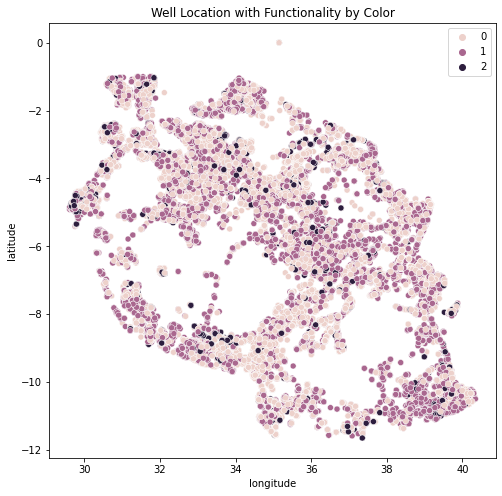

In [42]:
#fig, ax = plt.subplots(figsize=(8,8))
plt.figure(figsize=(8,8))
sns.scatterplot(x='longitude', y='latitude', hue='target', data=df_2)#, ax=ax
plt.title('Well Location with Functionality by Color')
plt.legend();

In [43]:
"""
good
district_code   int ok
region_code     int ok
gps_height      int ok    Altitude of the well
construction_yearint ok   0 : 20709
"""
cols_num = ['latitude','longitude','district_code','region_code','gps_height','construction_year','population','age','pop_per_year']
cols_obj = ['scheme_management','extraction_type_class','management','payment','quality_group',
'source','waterpoint_type_group']
df_3 = df_2[cols_obj]
df_4 = df_2[cols_num]

In [44]:
df_3.head()

,scheme_management,extraction_type_class,management,payment,quality_group,source,waterpoint_type_group
0,VWC,gravity,vwc,pay annually,good,spring,communal standpipe
1,Other,gravity,wug,never pay,good,rainwater harvesting,communal standpipe
2,VWC,gravity,vwc,pay per bucket,good,dam,communal standpipe
3,VWC,submersible,vwc,never pay,good,machine dbh,communal standpipe
4,Unknown,gravity,other,never pay,good,rainwater harvesting,communal standpipe


In [45]:
df_4.describe()

,latitude,longitude,district_code,region_code,gps_height,construction_year,population,age,pop_per_year
count,5.940000e+04,59400.000000,59400.000000,59400.000000,59400.000000,59400.000000,59400.000000,59400.000000,59400.000000
mean,-5.706033e+00,35.149669,5.629747,15.297003,1033.015758,1996.814686,281.055791,15.106981,43.561193
std,2.946019e+00,2.567349,9.633649,17.587406,496.495329,10.065781,451.765815,10.096816,203.103031
min,-1.164944e+01,29.607122,0.000000,1.000000,-90.000000,1960.000000,1.000000,-7.000000,-900.000000
25%,-8.540621e+00,33.354079,2.000000,5.000000,903.000000,1996.000000,100.000000,8.000000,7.575758
50%,-5.021597e+00,35.149669,3.000000,12.000000,1060.000000,1996.814686,281.000000,14.185314,18.504721
75%,-3.326156e+00,37.178387,5.000000,17.000000,1319.250000,2004.000000,281.000000,16.185314,21.811688
max,-2.000000e-08,40.345193,80.000000,99.000000,2770.000000,2013.000000,30500.000000,53.000000,10166.666667


In [46]:
# def one_hot(df,cols_hot):
#     """
#     function applies one-hot encoding categorical features 
#     """
#     one_hot_df = pd.get_dummies(df, cols_hot, drop_first=True)
#     return one_hot_df
one_hot_df = pd.get_dummies(df_3, cols_obj, drop_first=True)

In [47]:
one_hot_df.head()

,scheme_management_None,scheme_management_Other,scheme_management_Parastatal,scheme_management_Private operator,scheme_management_SWC,scheme_management_Trust,scheme_management_Unknown,scheme_management_VWC,scheme_management_WUA,scheme_management_WUG,scheme_management_Water Board,scheme_management_Water authority,extraction_type_class_handpump,extraction_type_class_motorpump,extraction_type_class_other,extraction_type_class_rope pump,extraction_type_class_submersible,extraction_type_class_wind-powered,management_other,management_other - school,management_parastatal,management_private operator,management_trust,management_unknown,management_vwc,management_water authority,management_water board,management_wua,management_wug,payment_other,payment_pay annually,payment_pay monthly,payment_pay per bucket,payment_pay when scheme fails,payment_unknown,quality_group_fluoride,quality_group_good,quality_group_milky,quality_group_salty,quality_group_unknown,source_hand dtw,source_lake,source_machine dbh,source_other,source_rainwater harvesting,source_river,source_shallow well,source_spring,source_unknown,waterpoint_type_group_communal standpipe,waterpoint_type_group_dam,waterpoint_type_group_hand pump,waterpoint_type_group_improved spring,waterpoint_type_group_other
0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0
1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0
2,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0
4,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0


In [48]:
one_hot_df.shape

(59400, 54)

In [49]:
result = pd.concat([df_4, one_hot_df], axis=1)
result.head()

,latitude,longitude,district_code,region_code,gps_height,construction_year,population,age,pop_per_year,scheme_management_None,scheme_management_Other,scheme_management_Parastatal,scheme_management_Private operator,scheme_management_SWC,scheme_management_Trust,scheme_management_Unknown,scheme_management_VWC,scheme_management_WUA,scheme_management_WUG,scheme_management_Water Board,scheme_management_Water authority,extraction_type_class_handpump,extraction_type_class_motorpump,extraction_type_class_other,extraction_type_class_rope pump,extraction_type_class_submersible,extraction_type_class_wind-powered,management_other,management_other - school,management_parastatal,management_private operator,management_trust,management_unknown,management_vwc,management_water authority,management_water board,management_wua,management_wug,payment_other,payment_pay annually,payment_pay monthly,payment_pay per bucket,payment_pay when scheme fails,payment_unknown,quality_group_fluoride,quality_group_good,quality_group_milky,quality_group_salty,quality_group_unknown,source_hand dtw,source_lake,source_machine dbh,source_other,source_rainwater harvesting,source_river,source_shallow well,source_spring,source_unknown,waterpoint_type_group_communal standpipe,waterpoint_type_group_dam,waterpoint_type_group_hand pump,waterpoint_type_group_improved spring,waterpoint_type_group_other
0,-9.856322,34.938093,5,11,1390,1999.000000,109,12.000000,9.083333,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0
1,-2.147466,34.698766,2,20,1399,2010.000000,280,3.000000,93.333333,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0
2,-3.821329,37.460664,4,21,686,2009.000000,250,4.000000,62.500000,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
3,-11.155298,38.486161,63,90,263,1986.000000,58,27.000000,2.148148,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0
4,-1.825359,31.130847,1,18,1060,1996.814686,281,14.185314,19.809219,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0


In [50]:
result.shape

(59400, 63)

In [51]:
 from sklearn.model_selection import train_test_split

In [52]:
X = result.copy()
y = df_2['target']

In [53]:
#y.value_counts()
s = df_2['target']
counts = s.value_counts()
percent = s.value_counts(normalize=True)
percent100 = s.value_counts(normalize=True).mul(100).round(1).astype(str) + '%'
sample = pd.DataFrame({'counts': counts, 'per': percent, 'per100': percent100})
sample

,counts,per,per100
0,32259,0.543081,54.3%
1,22824,0.384242,38.4%
2,4317,0.072677,7.3%


In [54]:
from imblearn.over_sampling import SMOTE

In [55]:
# def smote_resample(y, X_train, y_train):
#     """
#     The target isn't balanced: functioning 54%, non-functioning 38%, functioning needs repair 7%
#     This function balances target with SMOTE
#     """
#     # Previous original class distribution
#     print('Original class distribution: \n')
#     print(y.value_counts())
#     smote = SMOTE()
#     X_train_resampled, y_train_resampled = smote.fit_sample(X_train, y_train) 
#     # Preview synthetic sample class distribution
#     print('-----------------------------------------')
#     print('Synthetic sample class distribution: \n')
#     print(pd.Series(y_train_resampled).value_counts()) 
    
#     return X_train_resampled, y_train_resampled

In [56]:

# sm = SMOTE(random_state=42)

# X_sm, y_sm = sm.fit_resample(X, y)

# print(f'''Shape of X before SMOTE: {X.shape}
# Shape of X after SMOTE: {X_sm.shape}''')

# print('\nBalance of positive and negative classes (%):')
# y_sm.value_counts(normalize=True) * 100


We will start our cleaning process by replacing all the 0 values from the construction year column with the arbitrairly selcetd year 1993.
With this cleaned construction year feature we can engineer a pump age and an average pop served per year feature.

In [57]:
# #Matt Kirby
# features['construction_year'] = features['construction_year'].replace({0:1993})
# features['age'] = features['date_recorded'].astype(str).str[:4].astype(int) - features['construction_year']
# features['pop/year'] = features['population'].replace({0:1}) / features['age'].replace({0:1})

In [58]:
# X_test['construction_year'] = X_test['construction_year'].replace({0:1993})
# X_test['age'] = X_test['date_recorded'].astype(str).str[:4].astype(int) - X_test['construction_year']
# X_test['pop/year'] = X_test['population'].replace({0:1}) / X_test['age'].replace({0:1})

In [59]:
# features['water_/_person'] = features['amount_tsh'].replace({0:1}) / features['population'].replace({0:1})

In [60]:
# X_test['water_/_person'] = X_test['amount_tsh'].replace({0:1}) / X_test['population'].replace({0:1})

In [61]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

In [62]:
from sklearn.preprocessing import MinMaxScaler

In [63]:
# def scale_data(sscaler, X_train, X_test,y_train):
#     """
#     fucntion sclaes the data
#     """
#     #scaler = sscaler
#     #transform the training and test sets
#     scaled_data_train = sscaler.fit_transform(X_train, y_train)
#     scaled_data_test = sscaler.transform(X_test)
#     #convert into a dataframe
#     scaled_df_tra = pd.DataFrame(scaled_data_train, columns=df_2.columns)
#     scaled_df_tes = pd.DataFrame(scaled_data_test, columns=df_2.columns)
    
#     return scaled_df_tra, scaled_df_tes

In [64]:

# scaler = MinMaxScaler()
# scaler.fit(X_train)

# X_train = scaler.transform(X_train)
# X_test = scaler.transform(X_test)

This task is project is a ternary classification problem because the target value has three classifictions: functional, non functional and functional needs repair. As displayed above we can see that value_counts are not balanced.  This could impact the accuracy of the model's performance.  We are going to run SMOTE on our training set to resample our set and get equal values for each category. 

In [65]:
sm = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = sm.fit_sample(X_train, y_train)

In [66]:
print(X_train_resampled.shape)
print(y_train_resampled.shape)
print(X_test.shape)
print(y_test.shape)

(72483, 63)
(72483,)
(14850, 63)
(14850,)


In [67]:
from sklearn.linear_model import LogisticRegression

from sklearn import metrics
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score,auc
#from sklearn.metrics import recall_score
#from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score, recall_score,f1_score, confusion_matrix,classification_report
from sklearn.metrics import precision_score

from yellowbrick.classifier import ROCAUC

from sklearn.model_selection import cross_val_score

In [68]:

def eval_classification_model(class_model, X_train,X_test, y_train, y_test,
                              normalize='true',cmap='Blues',figsize=[10,5]):
    """
    Algorithm for classification model
    Args
     df (df)
     X_train (int)
     X_test ()
     y_train ()
     y_test ()
     figsize (dict)
    """
    #Classification Model
    
#     timer = Timer()
#     timer.start()
#     print('\n')
    class_model.fit(X_train, y_train)
    
    
    # get Predictions
    y_hat_train = class_model.predict(X_train)
    y_hat_test =  class_model.predict(X_test)
    #evaluate model
    print("Training Accuracy on  Model: {}".format(accuracy_score(y_train, y_hat_train)))
    print("Testing Accuracy on  Model: {}".format(accuracy_score(y_test, y_hat_test)))
    #roc = roc_auc_score(y_test, y_hat_test)
    #print("ROC_AUC score: {}".format(roc_auc_score(y_test, y_hat_test,multi_class='ovr')))
#     print('Recall: {}'.format(recall_score(y_test, y_hat_test, average=None))) #average='micro'
#     print('Recall: {}'.format(recall_score(y_test, y_hat_test, average=None)[1]))
    scores = cross_val_score(class_model,X_test, y_test,cv=5)
    print('Cross-validation scores on testing set: {}'.format(scores))
    print('Average cross-validation score on testing set: {:.2f}'.format(scores.mean()))
    
    print(dashes)
    print('\n')
    #adaboost_confusion_matrix = confusion_matrix(y_test, adaboost_test_preds)
    ada_cf_matrix = confusion_matrix(y_hat_test,y_test)  #axes[0]
    print(ada_cf_matrix)
    print('\n')
    
    # Classification Report / Accuracy Score 
    print(dashes)
    print("Classification Report")
    print(dashes)
    classes = ['0/Functional','1/Non-functioning','2/Needs Repair']
    print(metrics.classification_report(y_test,y_hat_test,target_names=classes))  
    print(dashes)
    print('\n')

    fig, axes = plt.subplots(ncols=2,figsize= figsize)   #ncols=2,
    #Confusion Matrix
    metrics.plot_confusion_matrix(class_model,X_test,y_test,normalize=normalize,
                                  cmap=cmap, ax=axes[0])  #axes[0]
    
    visualizer = ROCAUC(class_model, classes=["functioning", "non-functioning",'functioning needs repair'],ax=axes[1])
 #   plt.legend(handles=[visualizer], title='title', bbox_to_anchor=(1.05, 1), loc='upper left')
 #   plt.legend((bbox_to_anchor=(0.4,0.8), loc="upper right")
    """
    visualizer.fit(X_train, y_train)        # Fit the training data to the visualizer
    visualizer.score(X_test, y_test)        # Evaluate the model on the test data
    """
    visualizer.fit(X_train, y_train)        # Fit the training data to the visualizer
    visualizer.score(X_test, y_test)        # Evaluate the model on the test data
    #plt.legend(visualizer,loc='center left', bbox_to_anchor=(1, 0.5))
    visualizer.show() 
    
    #timer.stop()
    return class_model

Training Accuracy on  Model: 0.6129989100892623
Testing Accuracy on  Model: 0.5971717171717171
Cross-validation scores on testing set: [0.68047138 0.67373737 0.67037037 0.68754209 0.66329966]
Average cross-validation score on testing set: 0.68
------------------------------------------------------------


[[5492 1823  460]
 [1252 2982  220]
 [1354  873  394]]


------------------------------------------------------------
Classification Report
------------------------------------------------------------
                   precision    recall  f1-score   support

     0/Functional       0.71      0.68      0.69      8098
1/Non-functioning       0.67      0.53      0.59      5678
   2/Needs Repair       0.15      0.37      0.21      1074

         accuracy                           0.60     14850
        macro avg       0.51      0.52      0.50     14850
     weighted avg       0.65      0.60      0.62     14850

------------------------------------------------------------




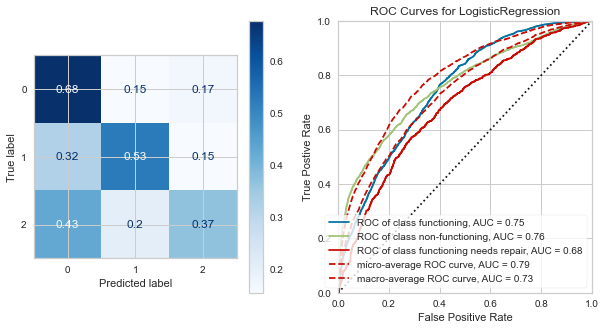

In [69]:
model = eval_classification_model(LogisticRegression(fit_intercept=False, C=1e12, 
                solver='liblinear'), X_train_resampled, X_test, 
                 y_train_resampled, y_test)

In [70]:
lr = LogisticRegression(fit_intercept=False, C=1e12, 
                solver='liblinear')
lr.fit(X_train_resampled, y_train_resampled)

y_pred = lr.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.71      0.68      0.69      8098
           1       0.67      0.53      0.59      5678
           2       0.15      0.37      0.21      1074

    accuracy                           0.60     14850
   macro avg       0.51      0.52      0.50     14850
weighted avg       0.65      0.60      0.62     14850



In [71]:
confmat = confusion_matrix(y_true=y_test, y_pred=y_pred)
confmat

array([[5492, 1252, 1354],
       [1823, 2982,  873],
       [ 460,  220,  394]])

In [72]:

from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
import lightgbm as lgb
#from catboost import CatBoostClassifier

from sklearn.preprocessing import RobustScaler, MinMaxScaler, StandardScaler, Normalizer, FunctionTransformer
from sklearn.preprocessing import OneHotEncoder

from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV

from sklearn.ensemble import VotingClassifier
from sklearn.model_selection import GridSearchCV

In [73]:
model_dict = {
#     'KNN': { 'model' : KNeighborsClassifier(),
#                          'params' : { 
#                                         "n_neighbors" : [3,5,7,9,11,13,15],
#                                         "weights" : ['uniform', 'distance']}
#              },
    'random_forest': {
        'model': RandomForestClassifier(),
        'params': {
             'bootstrap': [True],
            'max_depth': [80, 90, 100, 110],
            'max_features': ['auto', 'sqrt'],
            #'min_samples_leaf': [3, 4, 5],
            'min_samples_split': [5, 10],
            'n_estimators': [100,200,300],#[100, 200, 300,500]
            # 'n_estimators': [100,150],
            # #'max_depth': [int(x) for x in np.linspace(10, 15, num = 11)],
            # 'max_features': ['auto', 'sqrt'],
            #  'min_samples_split': [5,10],
             'class_weight':['balanced'],
              'criterion' :['gini', 'entropy']
             }
             }

# # #             'num_leaves':[128],             
#        'lightGBM': {'model': lgb.LGBMClassifier(),       
#                    'params': {            'max_depth':[8,10],
#                   #                        # 'min_data': [50],
#                   #                         'max_bin': [200,250,275],
                             
#                                           'num_iterations': [75,100,150,200,300,400,500,600,650], 
#                                         #  'boosting_type': ['gbdt'], 
#                                         #   'objective' : ['binary'],
#                                           'metric': ['binary'],
                                      
#                                          'learning_rate':[0.001,0.003,0.01, 0.05, 0.1]}
#                                 }

                            #    'XGBoost': { 'model' : xgb.XGBClassifier(use_label_encoder=False, verbosity = 0, probability=True),
                            #  'params' : { 
                                          
                            #             'max_depth': [2,3,4], 
                            #             'n_estimators': [100,200,250,275,300],
                            #             'learning_rate' :[0.01,0.03,0.05,0.1]
                            #                  }}
              
              # 'CatBoost': { 'model' :CatBoostClassifier(),
              # 'params' : { 
              #     #'n_estimators': [100, 200, 300],
              #     'max_depth': [3,4,5],
              #      'iterations': [50] 
              #             #'depth': [16], 
              #             #'learning_rate': [0.1]
              #             }
              #  }
              
              }

In [ ]:

scores = []
for model_name, mp in model_dict.items():
     clf = GridSearchCV(mp['model'], mp['params'],cv=5,  return_train_score=False) #refit='f1_weighted',
     clf.fit(X_train, y_train)
     y_pred = clf.predict(X_test) 
    
     accuracy = accuracy_score(y_test, y_pred)
     #f1 = f1_score(y_test, y_pred)
     #roc = roc_auc_score(y_test, y_pred)

     scores.append({
      'model':model_name,
      'accuracy': accuracy,
      #'classifier': clf.best_estimator_,
      #'f1': f1,
      #'roc':roc,
      #'best score': clf.best_score_,
      'best params': clf.best_params_
      })
# pd.set_option('display.max_colwidth', None)    
# gscv_models = pd.DataFrame(scores) #, columns=['model', 'accuracy', 'f1', 'roc','best score','best params']
# gscv_models

In [ ]:
# param_grid = {'learning_rate': [0.075, 0.07],
#                       'max_depth': [6, 7],
#                       'min_samples_leaf': [7,8],
#                       'max_features': [1.0],
#                       'n_estimators':[100, 200]} 
rf_params = gscv_models.iloc[0]['best params']
rf = RandomForestClassifier(**rf_params)
model = rf.fit(X_train_resampled, y_train_resampled)
y_pred=model.predict(X_test)

In [ ]:
rf_cm = confusion_matrix(y_test, y_pred)
sns.heatmap(rf_cm, annot=True, fmt="d")

In [ ]:
def eval_classification_model(X_train_resampled, X_test, y_train_resampled, y_pred,
                              normalize='true',cmap='Blues',figsize=[10,5]):
      
    # Classification Report / Accuracy Score 
    print(dashes)
    print("Classification Report")
    print(dashes)
    classes = ['0/Functional','1/Non-functioning','2/Needs Repair']
    print(metrics.classification_report(y_test,y_pred,target_names=classes))  
    print(dashes)
    print('\n')

#     figsize =(8, 8)
#     fig, axes = plt.subplots(ncols=1,figsize= figsize)   #ncols=2,
#     #Confusion Matrix
    
    plt.figure(figsize=(8,8))
    rf_cm = confusion_matrix(y_test, y_pred)
    sns.heatmap(rf_cm, annot=True, fmt="d")
#     metrics.plot_confusion_matrix(model, X_test,y_pred,normalize=normalize,
#                                   cmap=cmap)  #axes[0]
    

In [ ]:
model = eval_classification_model(X_train_resampled, X_test, 
                 y_train_resampled, y_pred)